#SARS CoV 2 sc-RNA-seq Analysis
## Overview
This notebook constitutes the first deliverable of the SARS-CoV-2 Infection Dynamics project. It focuses on preprocessing the single-cell RNA sequencing (scRNA-seq) data obtained from the study by *Ravindra et al., 2021 (PLOS Biology)*. The aim is to prepare high-quality, normalized data for subsequent analyses  including neighbourhood clustering, cell type identification, and pseudotime trajectory inference.

In this stage, we will:

1.Load raw scRNA-seq count matrices.

2.Perform quality control  (QC) to remove low-quality cells and genes.

3.Normalize and transform the expression data.

4.Annotate metadata (infection condition, sample time points, etc.).

5.Save a clean .h5ad file for downstream analysis.

## Install Packages

In [1]:
# Create environment by installing packages
!pip install scanpy
!pip install anndata
!pip install celltypist
!pip install decoupler
!pip install fa2-modified
!pip install scvelo
!pip install igraph
!pip install scikit-misc

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.1/2.1 MB 38.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 172.3/172.3 kB 16.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 233.3/233.3 kB 22.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 56.9/56.9 kB 5.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 10.3/10.3 MB 145.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 90.1/90.1 kB 8.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 58.2/58.2 kB 5.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 284.1/284.1 kB 24.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 9.2/9.2 MB 127.5 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 45.1/45.1 kB 2.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 7.3/7.3 MB 80.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.7/2.7 MB 110.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 250.9/250

## A. Preprocessing

### 01. Unzipping and Loading Datasets

In [2]:
import tarfile
import os

!tar -xvf "/content/GSE166766_RAW (5).tar" -C "/content/Extracted files"     #[run this cell to extract tar.gz files]

GSM5082289_mock_barcodes.tsv.gz
GSM5082289_mock_features.tsv.gz
GSM5082289_mock_matrix.mtx.gz
GSM5082290_1dpi_barcodes.tsv.gz
GSM5082290_1dpi_features.tsv.gz
GSM5082290_1dpi_matrix.mtx.gz
GSM5082291_2dpi_barcodes.tsv.gz
GSM5082291_2dpi_features.tsv.gz
GSM5082291_2dpi_matrix.mtx.gz
GSM5082292_3dpi_barcodes.tsv.gz
GSM5082292_3dpi_features.tsv.gz
GSM5082292_3dpi_matrix.mtx.gz


In [3]:
# Import datasets
import scanpy as sc
import scvelo as scv
import anndata as ad
import numpy as np
import shutil

In [4]:
!pwd

/content


In [5]:
#Import and load  datasets
mock_adata = sc.read_10x_mtx('/content/mock/')
srv_1dpi_adata = sc.read_10x_mtx('/content/1dpi/')
srv_2dpi_adata = sc.read_10x_mtx('/content/2dpi/')
srv_3dpi_adata = sc.read_10x_mtx('/content/3dpi/')

In [6]:
 #Add metadata to track which condition this sample belongs to
mock_adata.obs['condition'] = 'mock'
srv_1dpi_adata.obs['condition'] = '1dpi'
srv_2dpi_adata.obs['condition'] = '2dpi'
srv_3dpi_adata.obs['condition'] = '3dpi'

### 02. Data Inspection
##### Checking important metrics

In [7]:
print(mock_adata)
print(srv_1dpi_adata)
print(srv_2dpi_adata)
print(srv_3dpi_adata)

AnnData object with n_obs × n_vars = 22609 × 33539
    obs: 'condition'
    var: 'gene_ids', 'feature_types'
AnnData object with n_obs × n_vars = 11834 × 33539
    obs: 'condition'
    var: 'gene_ids', 'feature_types'
AnnData object with n_obs × n_vars = 14695 × 33539
    obs: 'condition'
    var: 'gene_ids', 'feature_types'
AnnData object with n_obs × n_vars = 28530 × 33539
    obs: 'condition'
    var: 'gene_ids', 'feature_types'


In [8]:
adata_list = [mock_adata, srv_1dpi_adata, srv_2dpi_adata, srv_3dpi_adata]
adata = ad.concat(adata_list)

In [9]:
adata

AnnData object with n_obs × n_vars = 77668 × 33539
    obs: 'condition'

In [10]:
mock_adata.var.head()
srv_1dpi_adata.var.head()
srv_2dpi_adata.var.head()
srv_3dpi_adata.var.head()

,gene_ids,feature_types
MIR1302-2HG,ENSG00000243485,Gene Expression
FAM138A,ENSG00000237613,Gene Expression
OR4F5,ENSG00000186092,Gene Expression
AL627309.1,ENSG00000238009,Gene Expression
AL627309.3,ENSG00000239945,Gene Expression


### 03.  Quality Control (QC)

##### 3.1. Compute quality control metrics

In [11]:
# Basic QC before filtering

## -- Identification of low-quality or dying cells

#mock dataset
mock_adata.var["MT"] = mock_adata.var_names.str.startswith("MT-")
mock_adata.var["RIBO"] = mock_adata.var_names.str.startswith(("RPS","RPL"))
mock_adata.var["HB"] = mock_adata.var_names.str.contains(("^HB[^(P)]"))
sc.pp.calculate_qc_metrics(
    mock_adata,qc_vars=["MT", 'RIBO', 'HB'], inplace=True, log1p=True
)

#1dpi dataset
srv_1dpi_adata.var["MT"] = srv_1dpi_adata.var_names.str.startswith("MT-")
srv_1dpi_adata.var["RIBO"] = srv_1dpi_adata.var_names.str.startswith(("RPS","RPL"))
srv_1dpi_adata.var["HB"] = srv_1dpi_adata.var_names.str.contains(("^HB[^(P)]"))
sc.pp.calculate_qc_metrics(
    srv_1dpi_adata,qc_vars=["MT", 'RIBO', 'HB'], inplace=True, log1p=True
)

#2dpi dataset
srv_2dpi_adata.var["MT"] = srv_2dpi_adata.var_names.str.startswith("MT-")
srv_2dpi_adata.var["RIBO"] = srv_2dpi_adata.var_names.str.startswith(("RPS","RPL"))
srv_2dpi_adata.var["HB"] = srv_2dpi_adata.var_names.str.contains(("^HB[^(P)]"))
sc.pp.calculate_qc_metrics(
    srv_2dpi_adata,qc_vars=["MT", 'RIBO', 'HB'], inplace=True, log1p=True
)

#3dpi dataset
srv_3dpi_adata.var["MT"] = srv_3dpi_adata.var_names.str.startswith("MT-")
srv_3dpi_adata.var["RIBO"] = srv_3dpi_adata.var_names.str.startswith(("RPS","RPL"))
srv_3dpi_adata.var["HB"] = srv_3dpi_adata.var_names.str.contains(("^HB[^(P)]"))
sc.pp.calculate_qc_metrics(
    srv_3dpi_adata,qc_vars=["MT", 'RIBO', 'HB'], inplace=True, log1p=True
)


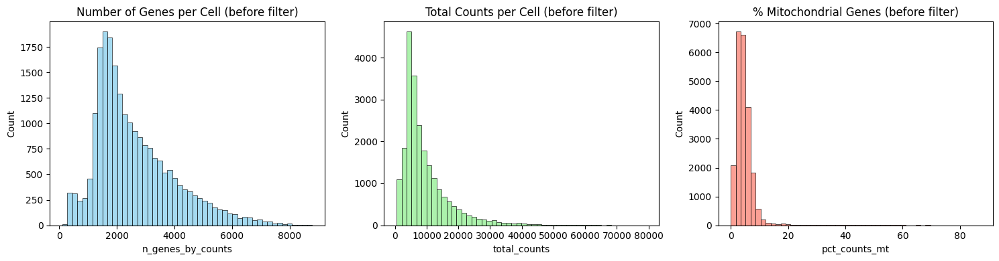

In [12]:
import matplotlib.pyplot as plt
import seaborn as sns

# --- Visualize distributions before filtering ---
fig, axes = plt.subplots(1, 3, figsize=(15, 4))
sns.histplot(mock_adata.obs['n_genes_by_counts'], bins=50, ax=axes[0], color='skyblue')
axes[0].set_title('Number of Genes per Cell (before filter)')
axes[0].set_xlabel('n_genes_by_counts')

sns.histplot(mock_adata.obs['total_counts'], bins=50, ax=axes[1], color='lightgreen')
axes[1].set_title('Total Counts per Cell (before filter)')
axes[1].set_xlabel('total_counts')

sns.histplot(mock_adata.obs['pct_counts_MT'], bins=50, ax=axes[2], color='salmon')
axes[2].set_title('% Mitochondrial Genes (before filter)')
axes[2].set_xlabel('pct_counts_mt')

plt.tight_layout()
plt.show()

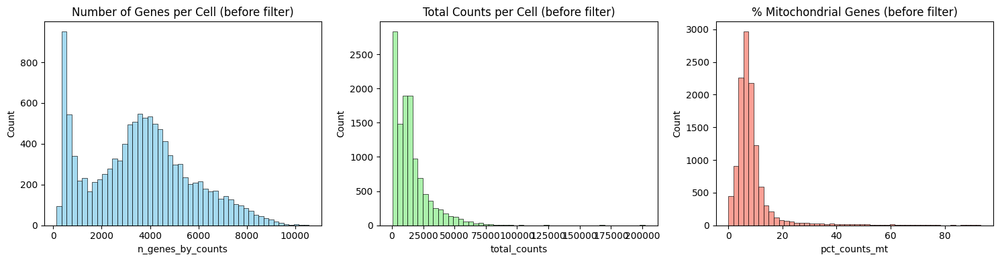

In [13]:
# --- Visualize distributions before filtering ---
fig, axes = plt.subplots(1, 3, figsize=(15, 4))
sns.histplot(srv_1dpi_adata.obs['n_genes_by_counts'], bins=50, ax=axes[0], color='skyblue')
axes[0].set_title('Number of Genes per Cell (before filter)')
axes[0].set_xlabel('n_genes_by_counts')

sns.histplot(srv_1dpi_adata.obs['total_counts'], bins=50, ax=axes[1], color='lightgreen')
axes[1].set_title('Total Counts per Cell (before filter)')
axes[1].set_xlabel('total_counts')

sns.histplot(srv_1dpi_adata.obs['pct_counts_MT'], bins=50, ax=axes[2], color='salmon')
axes[2].set_title('% Mitochondrial Genes (before filter)')
axes[2].set_xlabel('pct_counts_mt')

plt.tight_layout()
plt.show()

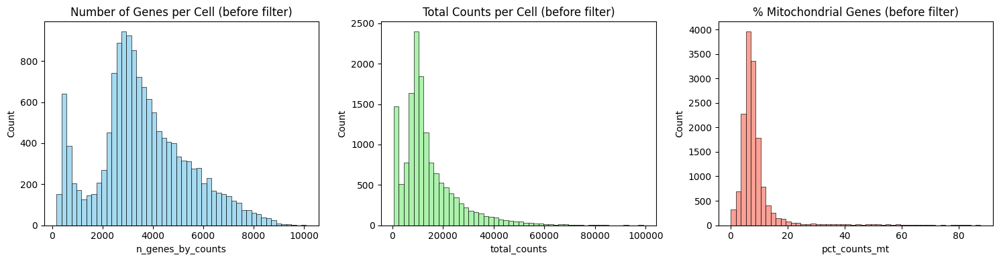

In [14]:
# --- Visualize distributions before filtering ---
fig, axes = plt.subplots(1, 3, figsize=(15, 4))
sns.histplot(srv_2dpi_adata.obs['n_genes_by_counts'], bins=50, ax=axes[0], color='skyblue')
axes[0].set_title('Number of Genes per Cell (before filter)')
axes[0].set_xlabel('n_genes_by_counts')

sns.histplot(srv_2dpi_adata.obs['total_counts'], bins=50, ax=axes[1], color='lightgreen')
axes[1].set_title('Total Counts per Cell (before filter)')
axes[1].set_xlabel('total_counts')

sns.histplot(srv_2dpi_adata.obs['pct_counts_MT'], bins=50, ax=axes[2], color='salmon')
axes[2].set_title('% Mitochondrial Genes (before filter)')
axes[2].set_xlabel('pct_counts_mt')

plt.tight_layout()
plt.show()

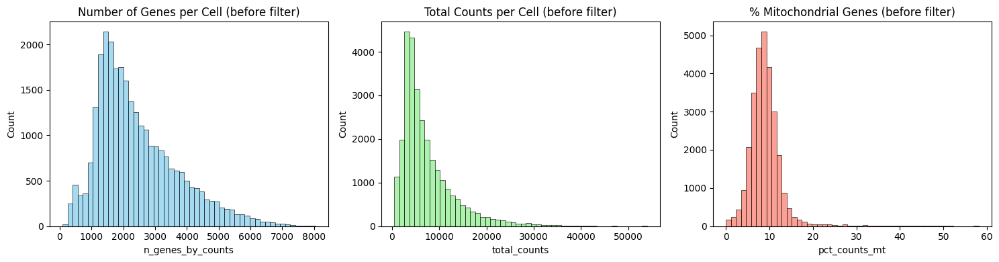

In [15]:
# --- Visualize distributions before filtering ---
fig, axes = plt.subplots(1, 3, figsize=(15, 4))
sns.histplot(srv_3dpi_adata.obs['n_genes_by_counts'], bins=50, ax=axes[0], color='skyblue')
axes[0].set_title('Number of Genes per Cell (before filter)')
axes[0].set_xlabel('n_genes_by_counts')

sns.histplot(srv_3dpi_adata.obs['total_counts'], bins=50, ax=axes[1], color='lightgreen')
axes[1].set_title('Total Counts per Cell (before filter)')
axes[1].set_xlabel('total_counts')

sns.histplot(srv_3dpi_adata.obs['pct_counts_MT'], bins=50, ax=axes[2], color='salmon')
axes[2].set_title('% Mitochondrial Genes (before filter)')
axes[2].set_xlabel('pct_counts_mt')

plt.tight_layout()
plt.show()

##### 3.2. Visualize before filtering

In [16]:
# Plot style setup for visual consistency
import matplotlib.pyplot as plt

plt.rcParams["figure.figsize"] = (5,4)  # Adjust figure size
plt.rcParams["axes.grid"] = True  # Add grid to plots
plt.rcParams["axes.edgecolor"] = "black" # Set plot border color
plt.rcParams["axes.linewidth"] = 1.5 # Set plot border width
plt.rcParams["axes.facecolor"] = "white" # Set background color
plt.rcParams["axes.labelcolor"] = "black" # Set label color
plt.rcParams["xtick.color"] = "black" # Set x-axis tick color
plt.rcParams["ytick.color"] = "black" # Set y-axis tick color
plt.rcParams["text.color"] = "black" # Set text color
%matplotlib inline

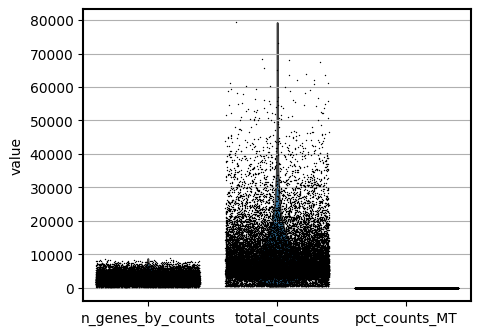

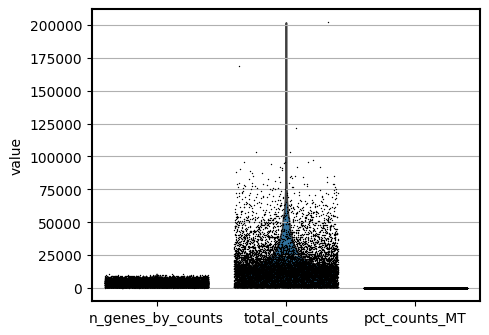

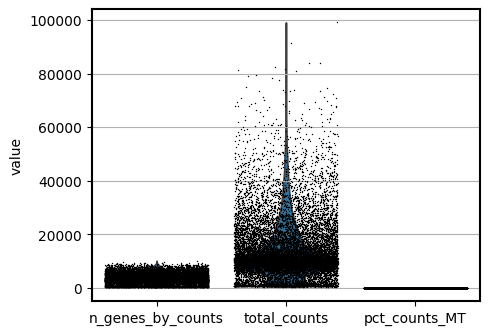

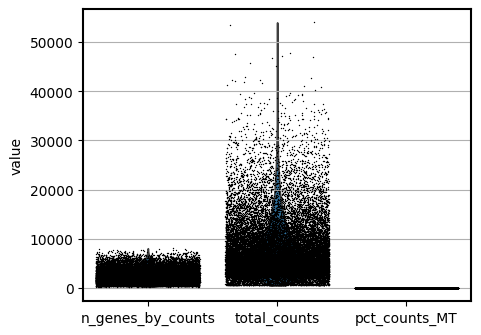

In [17]:
#Violin plots

#mock dataset
sc.pl.violin(
    mock_adata,
    ["n_genes_by_counts", 'total_counts', 'pct_counts_MT'],
    jitter=0.4,
    multi_panel=False,
)

#1dpi dataset
sc.pl.violin(
    srv_1dpi_adata,
    ["n_genes_by_counts", 'total_counts', 'pct_counts_MT'],
    jitter=0.4,
    multi_panel=False,
)

#2dpi dataset
sc.pl.violin(
    srv_2dpi_adata,
    ["n_genes_by_counts", 'total_counts', 'pct_counts_MT'],
    jitter=0.4,
    multi_panel=False,
)

#3dpi dataset
sc.pl.violin(
    srv_3dpi_adata,
    ["n_genes_by_counts", 'total_counts', 'pct_counts_MT'],
    jitter=0.4,
    multi_panel=False,
)

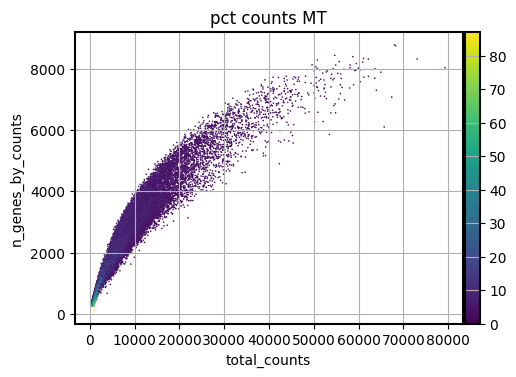

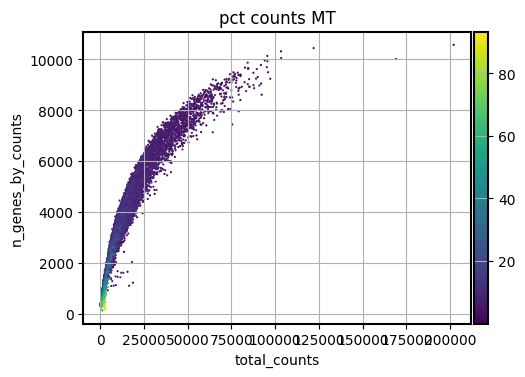

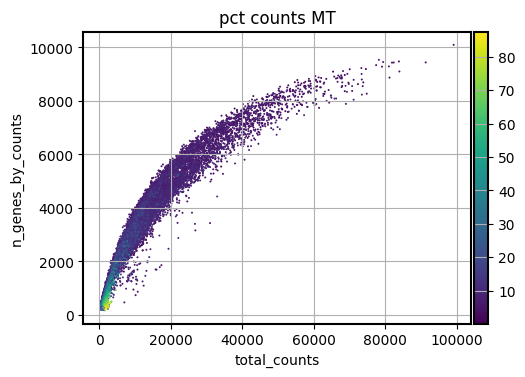

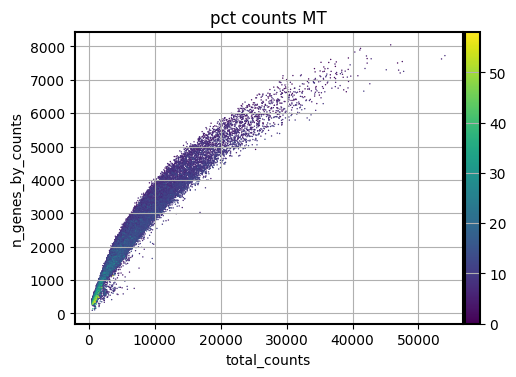

In [18]:
# Scatter plot of MT genes

#mock
sc.pl.scatter(mock_adata, "total_counts", "n_genes_by_counts", color="pct_counts_MT")

#1dpi
sc.pl.scatter(srv_1dpi_adata, "total_counts", "n_genes_by_counts", color="pct_counts_MT")

#2dpi
sc.pl.scatter(srv_2dpi_adata, "total_counts", "n_genes_by_counts", color="pct_counts_MT")

#3dpi
sc.pl.scatter(srv_3dpi_adata, "total_counts", "n_genes_by_counts", color="pct_counts_MT")

In [20]:
# filter for percent mito
# We filter out cells with >10% mitochondrial content.
# This removes dying or stressed cells, which can skew infection-related gene expression.
mock_adata = mock_adata[mock_adata.obs['pct_counts_MT'] < 10, :]

srv_1dpi_adata = srv_1dpi_adata[srv_1dpi_adata.obs['pct_counts_MT'] < 10, :]

srv_2dpi_adata = srv_2dpi_adata[srv_2dpi_adata.obs['pct_counts_MT'] < 10, :]

srv_3dpi_adata = srv_3dpi_adata[srv_3dpi_adata.obs['pct_counts_MT'] < 10, :]

##### 3.2. Normalize and transform.

In [21]:
# Normalize counts per cell to 10,000

#mock dataset
mock_adata.layers["counts"] = mock_adata.X.copy()
sc.pp.normalize_total(mock_adata)
sc.pp.log1p(mock_adata)  # log normalization

#1dpi
srv_1dpi_adata.layers["counts"] = srv_1dpi_adata.X.copy()
sc.pp.normalize_total(srv_1dpi_adata)
sc.pp.log1p(srv_1dpi_adata)  # log normalization

#2dpi
srv_2dpi_adata.layers["counts"] = srv_2dpi_adata.X.copy()
sc.pp.normalize_total(srv_2dpi_adata)
sc.pp.log1p(srv_2dpi_adata)  # log normalization

#3dpi
srv_3dpi_adata.layers["counts"] = srv_3dpi_adata.X.copy()
sc.pp.normalize_total(srv_3dpi_adata)
sc.pp.log1p(srv_3dpi_adata) # log normalization

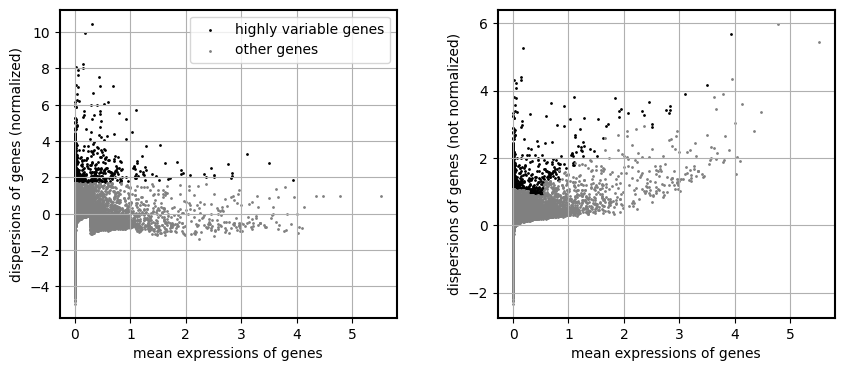

In [22]:
#feature selection
sc.pp.highly_variable_genes(mock_adata, n_top_genes=1000)
sc.pl.highly_variable_genes(mock_adata)

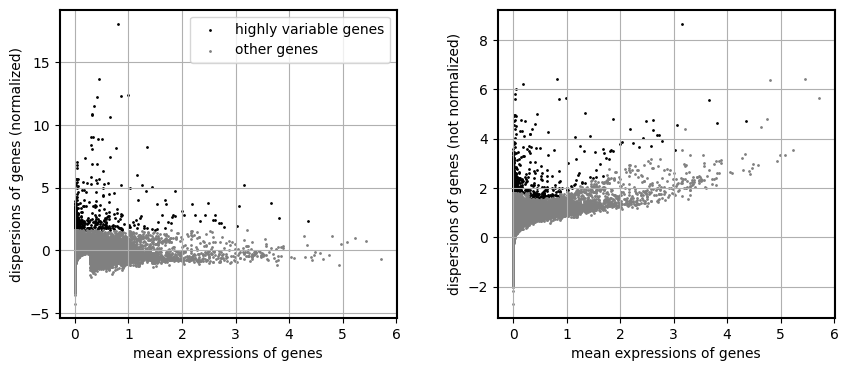

In [23]:
sc.pp.highly_variable_genes(srv_1dpi_adata, n_top_genes=1000)
sc.pl.highly_variable_genes(srv_1dpi_adata)

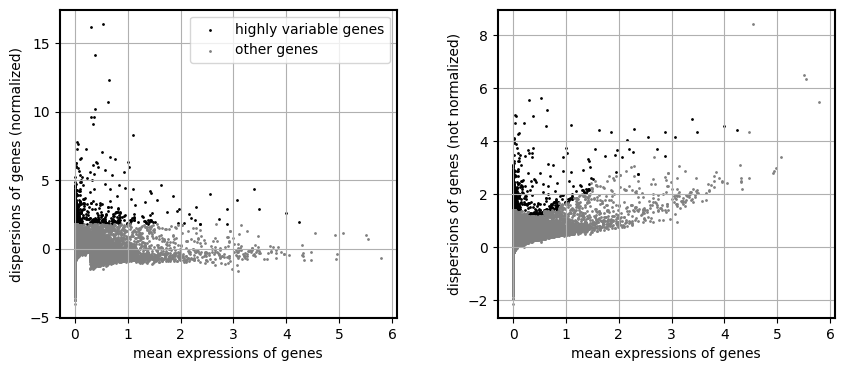

In [24]:
sc.pp.highly_variable_genes(srv_2dpi_adata, n_top_genes=1000)
sc.pl.highly_variable_genes(srv_2dpi_adata)

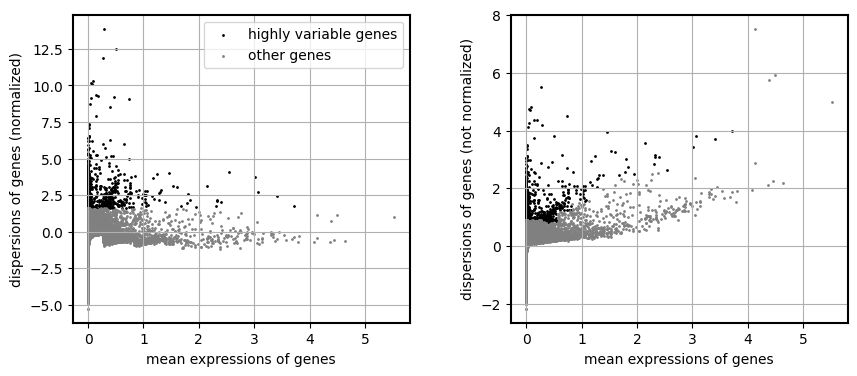

In [25]:
sc.pp.highly_variable_genes(srv_3dpi_adata, n_top_genes=1000)
sc.pl.highly_variable_genes(srv_3dpi_adata)

## B. Dimensionality Reduction

#### 01. PCA

In [26]:
#Dim Reduction
sc.tl.pca(mock_adata)

sc.tl.pca(srv_1dpi_adata)

sc.tl.pca(srv_2dpi_adata)

sc.tl.pca(srv_3dpi_adata)

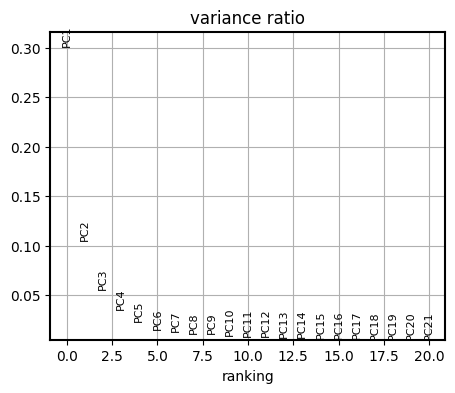

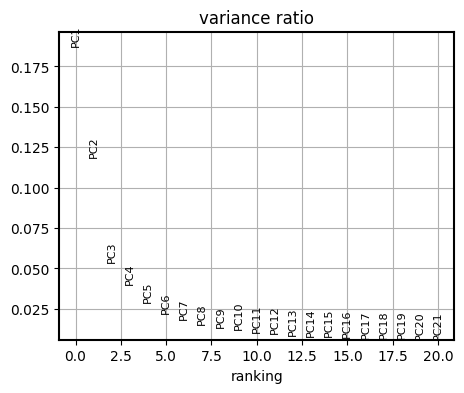

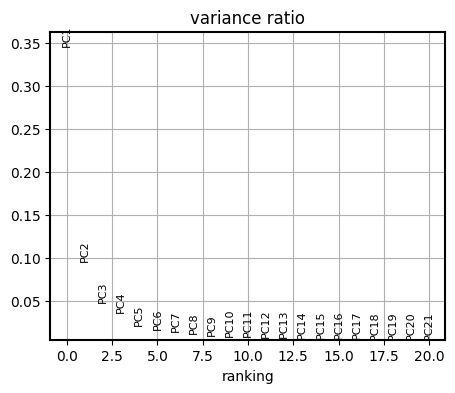

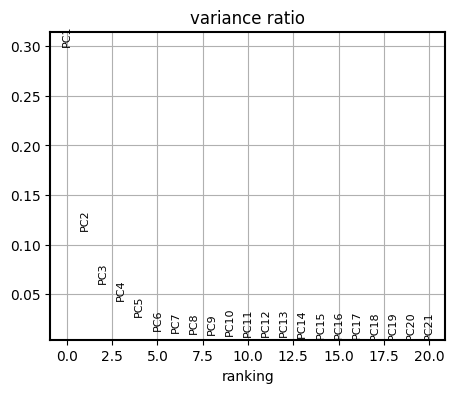

In [27]:
from leidenalg.Optimiser import log
sc.tl.pca(mock_adata, svd_solver='arpack')
sc.pl.pca_variance_ratio(mock_adata, n_pcs=20,log=False)

sc.tl.pca(srv_1dpi_adata, svd_solver='arpack')
sc.pl.pca_variance_ratio(srv_1dpi_adata, n_pcs=20,log=False)

sc.tl.pca(srv_2dpi_adata, svd_solver='arpack')
sc.pl.pca_variance_ratio(srv_2dpi_adata, n_pcs=20,log=False)

sc.tl.pca(srv_3dpi_adata, svd_solver='arpack')
sc.pl.pca_variance_ratio(srv_3dpi_adata, n_pcs=20,log=False)

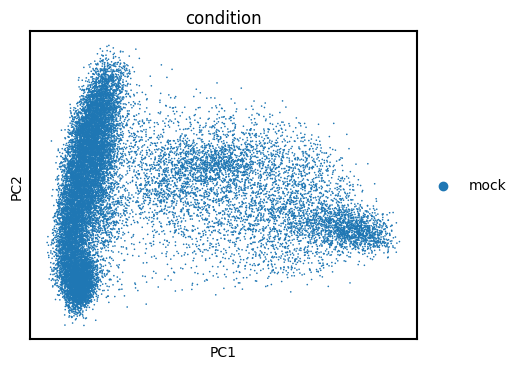

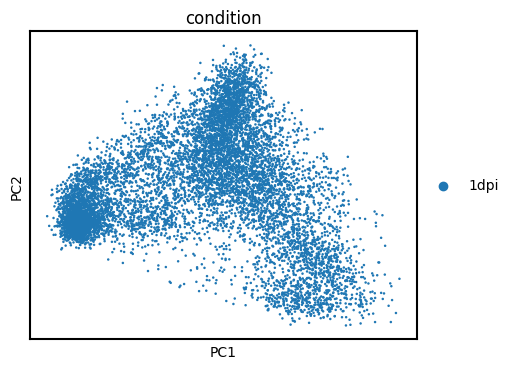

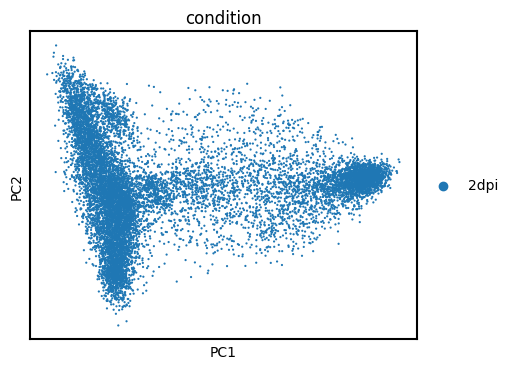

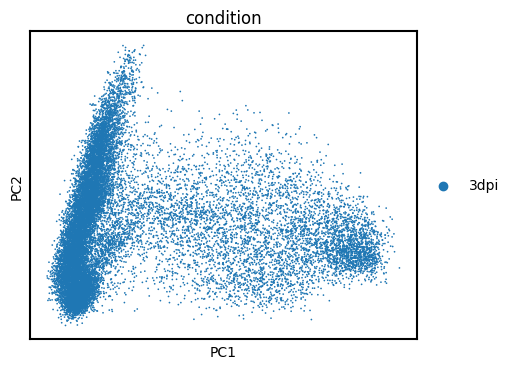

In [28]:
sc.pl.pca(mock_adata, color="condition", cmap="coolwarm")

sc.pl.pca(srv_1dpi_adata, color="condition", cmap="coolwarm")

sc.pl.pca(srv_2dpi_adata, color="condition", cmap="coolwarm")

sc.pl.pca(srv_3dpi_adata, color="condition", cmap="coolwarm")

## C. UMAP

In [29]:
#mock
sc.pp.neighbors(mock_adata) # Added this line to compute the neighborhood graph
sc.tl.umap(mock_adata)

#1dpi
sc.pp.neighbors(srv_1dpi_adata) # Added this line to compute the neighborhood graph
sc.tl.umap(srv_1dpi_adata)

#2dpi
sc.pp.neighbors(srv_2dpi_adata) # Added this line to compute the neighborhood graph
sc.tl.umap(srv_2dpi_adata)

#3dpi
sc.pp.neighbors(srv_3dpi_adata) # Added this line to compute the neighborhood graph
sc.tl.umap(srv_3dpi_adata)

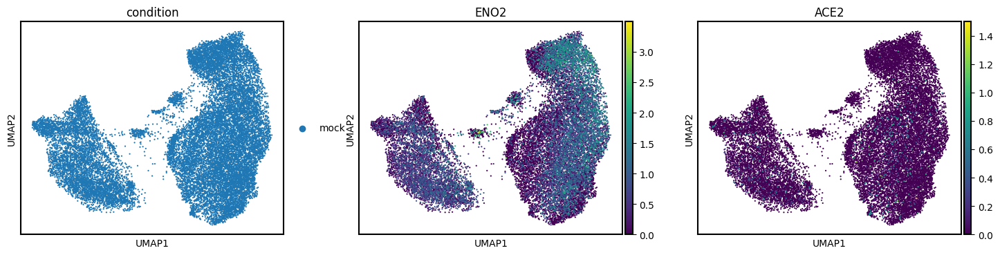

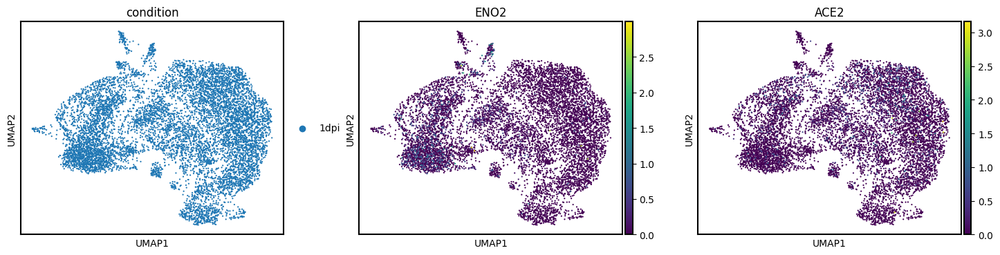

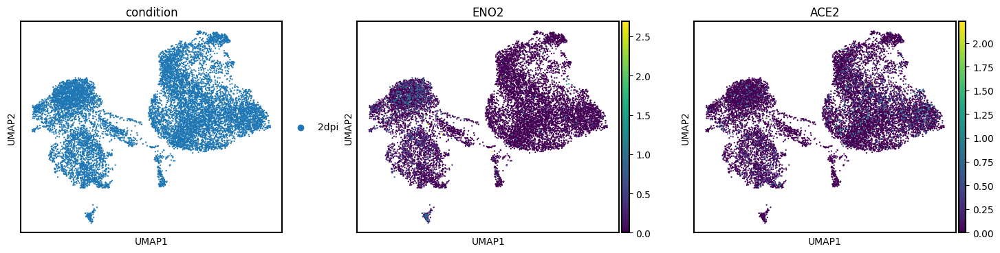

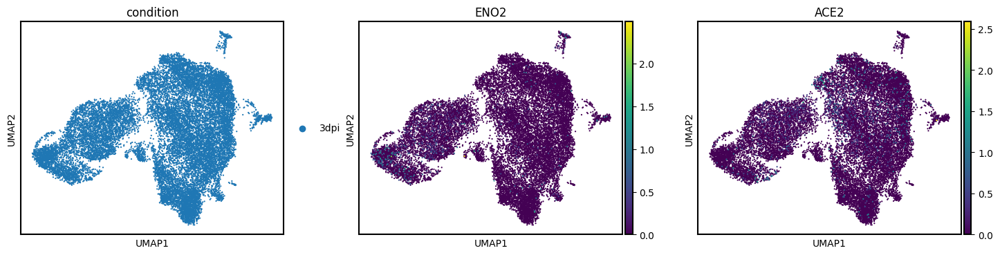

In [30]:
sc.pl.umap(
    mock_adata,
    color=["condition", "ENO2", "ACE2"],
    size=10
)

sc.pl.umap(
    srv_1dpi_adata,
    color=["condition", "ENO2", "ACE2"],
    size=10
)

sc.pl.umap(
    srv_2dpi_adata,
    color=["condition", "ENO2", "ACE2"],
    size=10
)

sc.pl.umap(
    srv_3dpi_adata,
    color=["condition", "ENO2", "ACE2"],
    size=10
)

In [31]:
#mock
sc.tl.leiden(mock_adata, flavor="igraph", n_iterations=10, key_added="leiden_res0_02", resolution=0.25)

#1dpi
sc.tl.leiden(srv_1dpi_adata, flavor="igraph", n_iterations=10, key_added="leiden_res0_02", resolution=0.25)

#2dpi
sc.tl.leiden(srv_2dpi_adata, flavor="igraph", n_iterations=10, key_added="leiden_res0_02", resolution=0.25)

#3dpi
sc.tl.leiden(srv_3dpi_adata, flavor="igraph", n_iterations=10, key_added="leiden_res0_02", resolution=0.25)

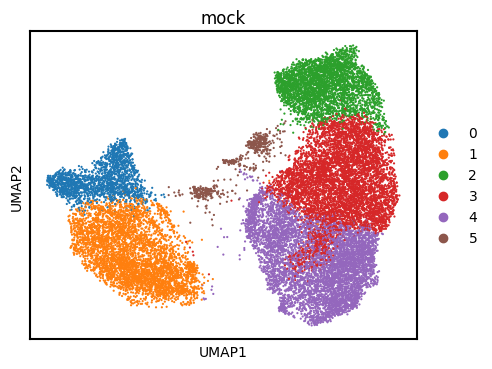

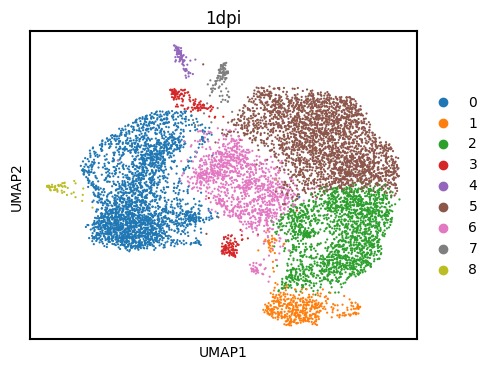

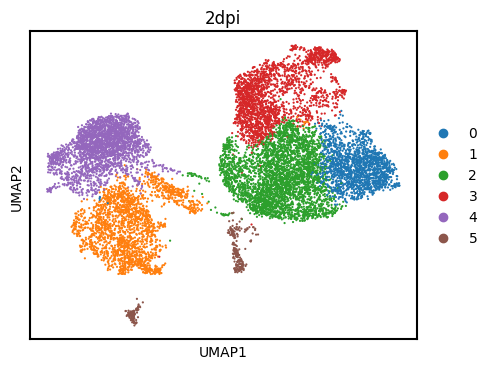

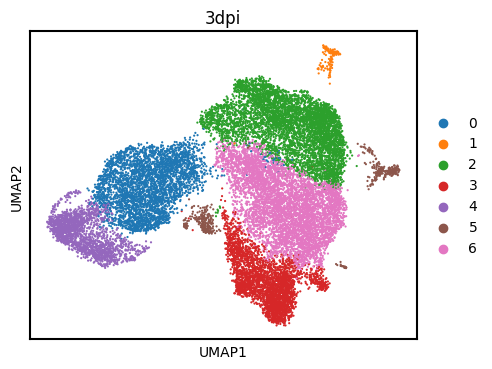

In [32]:
#mock
sc.pl.umap(
    mock_adata,
    color=["leiden_res0_02"],
    size=10,
    title="mock"
)

#1dpi
sc.pl.umap(
    srv_1dpi_adata,
    color=["leiden_res0_02"],
    size=10,
    title="1dpi"
)

#2dpi
sc.pl.umap(
    srv_2dpi_adata,
    color=["leiden_res0_02"],
    size=10,
    title="2dpi"
)

#3dpi
sc.pl.umap(
    srv_3dpi_adata,
    color=["leiden_res0_02"],
    size=10,
    title="3dpi"
)

## D. Cell Annotation

#### 01. Decoupler and Panglao DB

In [33]:
# Import decoupler for automatic mapping
import decoupler as dc

In [34]:
# Query Omnipath and get PanglaoDB
markers = dc.op.resource(name="PanglaoDB", organism="human")

In [35]:
markers.shape

(8211, 13)

In [36]:
markers.head()

,genesymbol,canonical_marker,cell_type,germ_layer,human,human_sensitivity,human_specificity,mouse,mouse_sensitivity,mouse_specificity,ncbi_tax_id,organ,ubiquitiousness
,,,,,,,,,,,,,
0,A1CF,False,Hepatocytes,Endoderm,True,0.189189,0.004437,True,0.175000,0.000257,9606,Liver,0.002
1,A2APA5,False,Germ cells,Mesoderm,False,0.000000,0.000000,True,0.432927,0.000000,10090,Reproductive,0.004
2,A2M,True,Bergmann glia,Ectoderm,True,0.000000,0.062343,True,0.333333,0.001604,9606,Brain,0.012
3,A3FIN4,False,Mast cells,Mesoderm,False,0.000000,0.000000,True,0.184211,0.000708,10090,Immune system,0.001
4,A4GALT,True,Mast cells,Mesoderm,True,0.000000,0.014133,True,0.000000,0.003023,9606,Immune system,0.005


In [37]:
markers['organ'].unique()

array(['Liver', 'Reproductive', 'Brain', 'Immune system', 'Zygote',
       'Kidney', 'Blood', 'Lungs', 'Bone', 'GI tract', nan, 'Vasculature',
       'Pancreas', 'Heart', 'Mammary gland', 'Olfactory system',
       'Connective tissue', 'Epithelium', 'Skeletal muscle', 'Skin',
       'Embryo', 'Smooth muscle', 'Eye', 'Adrenal glands', 'Thyroid',
       'Placenta', 'Thymus', 'Parathyroid glands', 'Oral cavity',
       'Urinary bladder'], dtype=object)

In [38]:
markers = markers[markers["organ"].isin(['Lungs', 'Epithelium', 'Immune system', 'Smooth Muscles'])]

In [39]:
markers.shape

(2099, 13)

In [40]:
import decoupler as dc
import pandas as pd

# 1. Re-load markers from the resource to ensure it's in the initial state
markers = dc.op.resource(name="PanglaoDB", organism="human")

# 2. Filter by organ
if 'organ' in markers.columns:
    markers = markers[markers["organ"].isin(['Lungs', 'Epithelium', 'Smooth muscle'])]
else:
    print("Warning: 'organ' column not found for organ filtering. Skipping.")

# 3. Remove duplicated entries using 'cell_type' and 'genesymbol'
# Check if columns exist before trying to use them for duplicated check
if 'cell_type' in markers.columns and 'genesymbol' in markers.columns:
    markers = markers[~markers.duplicated(["cell_type", "genesymbol"])]
else:
    print("Warning: 'cell_type' or 'genesymbol' column not found for duplicate removal. Skipping.")

# 4. Format because dc only accepts cell_type and genesymbol as 'source' and 'target'
# Check if columns exist before renaming
if 'cell_type' in markers.columns and 'genesymbol' in markers.columns:
    markers = markers.rename(columns={"cell_type": "source", "genesymbol": "target"})
else:
    print("Warning: 'cell_type' or 'genesymbol' column not found for renaming. Skipping.")

# 5. Select only 'source' and 'target' if they exist
if 'source' in markers.columns and 'target' in markers.columns:
    markers = markers[["source", "target"]]
else:
    print("Warning: 'source' or 'target' columns not found after processing. Final markers might be empty or incomplete.")

markers.head()

,source,target
,,
18,Pulmonary alveolar type II cells,ABCA3
31,Pulmonary alveolar type II cells,ABCD3
53,Basal cells,ACADVL
73,Mesothelial cells,ACKR3
75,Smooth muscle cells,ACKR3


In [41]:
mock_adata.var_names
srv_1dpi_adata.var_names
srv_2dpi_adata.var_names
srv_3dpi_adata.var_names

Index(['MIR1302-2HG', 'FAM138A', 'OR4F5', 'AL627309.1', 'AL627309.3',
       'AL627309.2', 'AL627309.4', 'AL732372.1', 'OR4F29', 'AC114498.1',
       ...
       'BX072566.1', 'AL354822.1', 'AC023491.2', 'AC004556.1', 'AC233755.2',
       'AC233755.1', 'AC240274.1', 'AC213203.1', 'FAM231C', 'scv2_orf1-10'],
      dtype='object', length=33539)

In [42]:
#mock
dc.mt.ulm(data=mock_adata, net=markers, tmin=3)

#1dpi
dc.mt.ulm(data=srv_1dpi_adata, net=markers, tmin=3)

#2dpi
dc.mt.ulm(data=srv_2dpi_adata, net=markers, tmin=3)

#3dpi
dc.mt.ulm(data=srv_3dpi_adata, net=markers, tmin=3)

#### 02. Label clusters based on the strongest enrichment scores.

In [43]:
#mock
score_mock = dc.pp.get_obsm(mock_adata, key="score_ulm")

#1dpi
score_1 = dc.pp.get_obsm(srv_1dpi_adata, key="score_ulm")

#2dpi
score_2 = dc.pp.get_obsm(srv_2dpi_adata, key="score_ulm")

#3dpi
score_3 = dc.pp.get_obsm(srv_3dpi_adata, key="score_ulm")

In [44]:
#Rank genes

#mock
mock_adata_gene_rank = dc.tl.rankby_group(score_mock, groupby="leiden_res0_02", reference="rest", method="t-test_overestim_var")
mock_adata_gene_rank = mock_adata_gene_rank[mock_adata_gene_rank["stat"] > 0]
mock_adata_gene_rank.head(5)

#1dpi
srv_1dpi_adata_gene_rank = dc.tl.rankby_group(score_1, groupby="leiden_res0_02", reference="rest", method="t-test_overestim_var")
srv_1dpi_adata_gene_rank = srv_1dpi_adata_gene_rank[srv_1dpi_adata_gene_rank["stat"] > 0]
srv_1dpi_adata_gene_rank.head(5)

#2dpi
srv_2dpi_adata_gene_rank = dc.tl.rankby_group(score_2, groupby="leiden_res0_02", reference="rest", method="t-test_overestim_var")
srv_2dpi_adata_gene_rank = srv_2dpi_adata_gene_rank[srv_2dpi_adata_gene_rank["stat"] > 0]
srv_2dpi_adata_gene_rank.head(5)

#3dpi
srv_3dpi_adata_gene_rank = dc.tl.rankby_group(score_3, groupby="leiden_res0_02", reference="rest", method="t-test_overestim_var")
srv_3dpi_adata_gene_rank = srv_3dpi_adata_gene_rank[srv_3dpi_adata_gene_rank["stat"] > 0]
srv_3dpi_adata_gene_rank.head(5)

,group,reference,name,stat,meanchange,pval,padj
0,0,rest,Ciliated cells,59.019443,2.749101,0.000000e+00,0.000000e+00
1,0,rest,Epithelial cells,33.815949,1.553508,1.776557e-231,1.421246e-230
2,0,rest,Clara cells,23.229565,1.590651,9.619631e-115,5.130470e-114
4,0,rest,Pulmonary alveolar type II cells,21.187205,0.487153,1.551829e-96,4.965854e-96
5,0,rest,Airway goblet cells,18.737372,1.165854,2.473290e-76,6.595440e-76


In [45]:
#mock
top_cell_type_per_group_mock = mock_adata_gene_rank.groupby('group')['name'].apply(lambda x: x.head(1))
display(top_cell_type_per_group_mock.to_dict())

#1dpi
top_cell_type_per_group_1 = srv_1dpi_adata_gene_rank.groupby('group')['name'].apply(lambda x: x.head(1))
display(top_cell_type_per_group_1.to_dict())

#2dpi
top_cell_type_per_group_2 = srv_2dpi_adata_gene_rank.groupby('group')['name'].apply(lambda x: x.head(1))
display(top_cell_type_per_group_2.to_dict())

#3dpi
top_cell_type_per_group_3 = srv_3dpi_adata_gene_rank.groupby('group')['name'].apply(lambda x: x.head(1))
display(top_cell_type_per_group_3.to_dict())

{('0', 6): 'Ciliated cells',
 ('1', 64): 'Ciliated cells',
 ('2', 16): 'Myoepithelial cells',
 ('3', 32): 'Mesothelial cells',
 ('4', 48): 'Ionocytes',
 ('5', 88): 'Vascular smooth muscle cells'}

{('0', 0): 'Ciliated cells',
 ('1', 16): 'Myoepithelial cells',
 ('2', 33): 'Mesothelial cells',
 ('3', 50): 'Myoepithelial cells',
 ('4', 64): 'Ionocytes',
 ('5', 80): 'Airway goblet cells',
 ('6', 96): 'Ciliated cells',
 ('7', 126): 'Airway epithelial cells',
 ('8', 132): 'Alveolar macrophages'}

{('0', 0): 'Airway goblet cells',
 ('1', 16): 'Ciliated cells',
 ('2', 64): 'Ionocytes',
 ('3', 32): 'Myoepithelial cells',
 ('4', 48): 'Ciliated cells',
 ('5', 88): 'Ionocytes'}

{('0', 0): 'Ciliated cells',
 ('1', 31): 'Alveolar macrophages',
 ('2', 32): 'Ionocytes',
 ('3', 48): 'Myoepithelial cells',
 ('4', 64): 'Ciliated cells',
 ('5', 89): 'Vascular smooth muscle cells',
 ('6', 96): 'Mesothelial cells'}

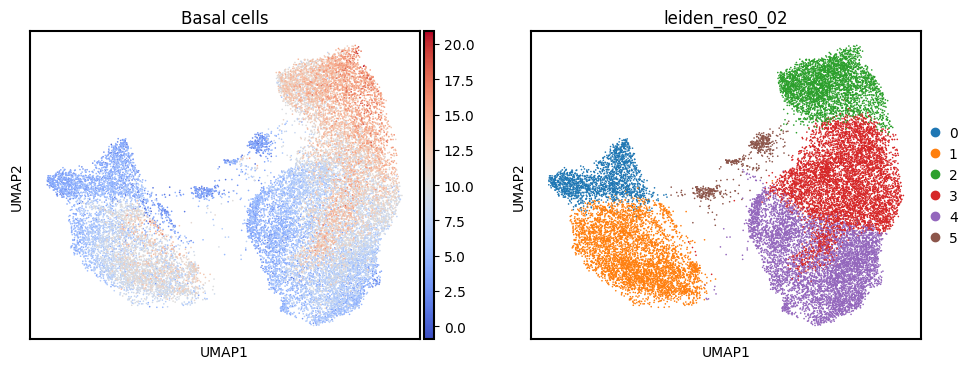

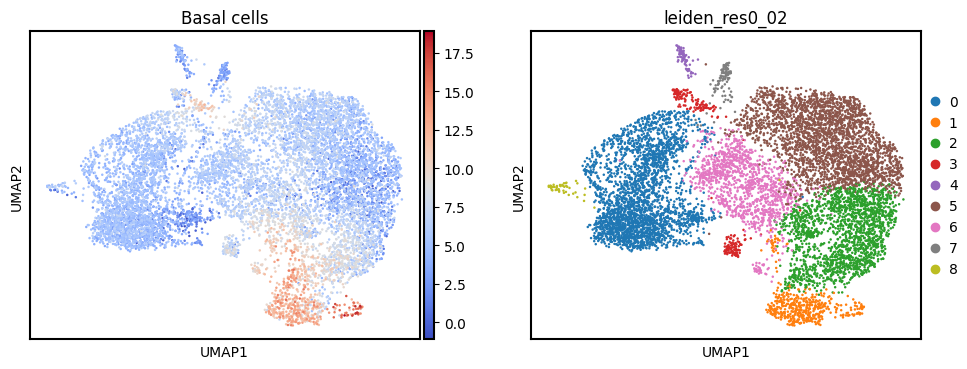

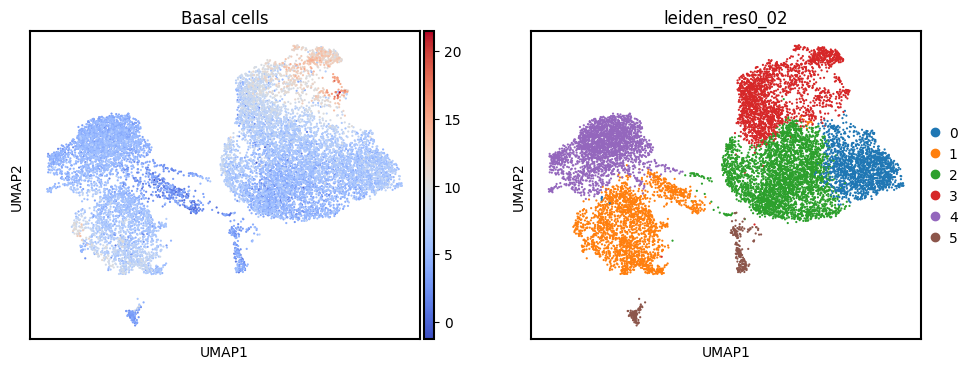

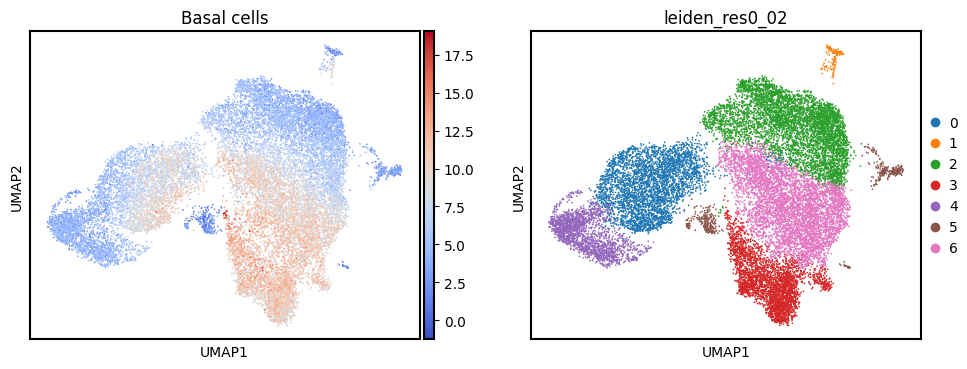

In [46]:
#mock
sc.pl.umap(score_mock, color=["Basal cells","leiden_res0_02"], cmap="coolwarm")

#1dpi
sc.pl.umap(score_1, color=["Basal cells","leiden_res0_02"], cmap="coolwarm")

#2dpi
sc.pl.umap(score_2, color=["Basal cells","leiden_res0_02"], cmap="coolwarm")

#3dpi
sc.pl.umap(score_3, color=["Basal cells","leiden_res0_02"], cmap="coolwarm")

#### 03. Visualize annotated UMAP

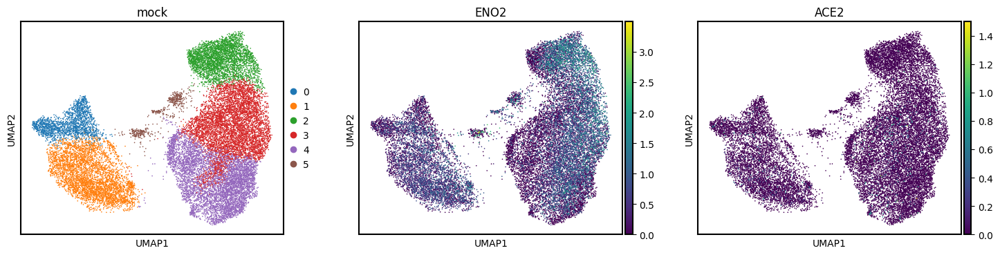

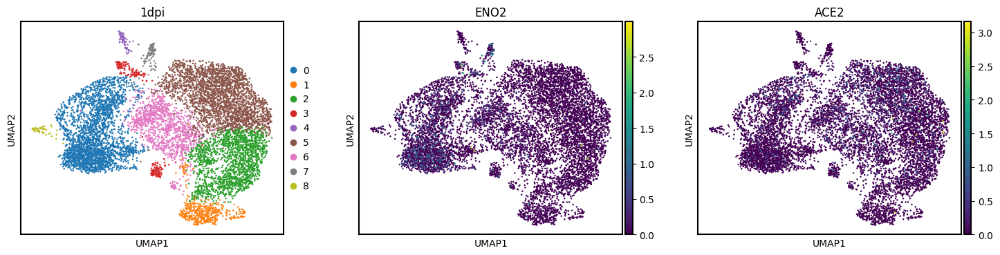

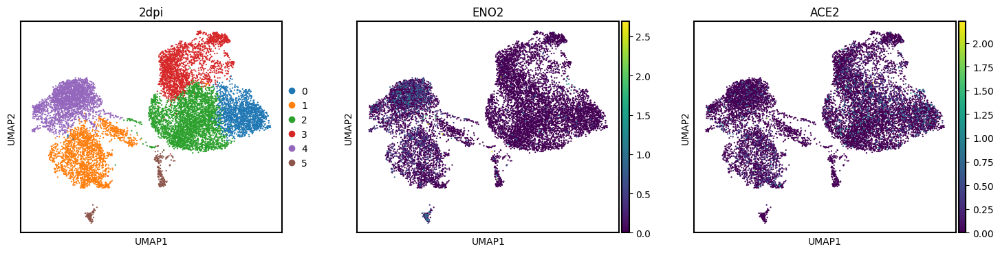

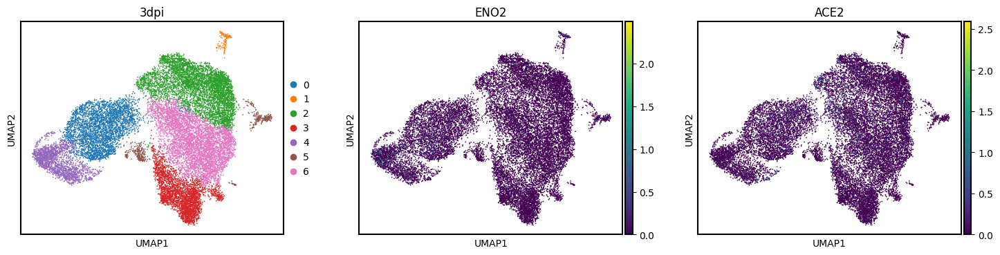

In [47]:
sc.pl.umap(
    mock_adata,
    color=[ "leiden_res0_02", 'ENO2', 'ACE2'],
    ncols=8,
    title= 'mock'
)

sc.pl.umap(
    srv_1dpi_adata,
    color=[ "leiden_res0_02", 'ENO2', 'ACE2'],
    ncols=8,
    title= '1dpi'
)

sc.pl.umap(
    srv_2dpi_adata,
    color=[ "leiden_res0_02", 'ENO2', 'ACE2'],
    ncols=8,
    title= '2dpi'
)

sc.pl.umap(
    srv_3dpi_adata,
    color=[ "leiden_res0_02", 'ENO2', 'ACE2'],
    ncols=8,
    title= '3dpi'
)

### SARS-CoV-2 Infection Progression Based on UMAPs

####Mock (Baseline Control)
##### In the mock condition, distinct and well-separated clusters represent a healthy, homeostatic airway epithelial environment. ACE2 expression is minimal and limited to a small subset of cells, consistent with its known sparse expression pattern in ionocytes and some secretory epithelial cells. ENO2 expression is low to moderate, restricted to a few metabolically active subpopulations. This condition defines the baseline transcriptional architecture of the bronchial epithelium, showing clear cellular identity and metabolic stability before viral exposure.


#### 1 dpi
#####  Early Viral Entry and Initial Cellular Stress...At 1 day post-infection (1 dpi), cluster boundaries begin to blur slightly compared to the mock state, indicating early transcriptional perturbation. While ACE2 expression remains sparse, its signal is slightly more dispersed across clusters, implying that viral entry may have initiated in multiple epithelial subtypes beyond just ionocytes.ENO2 expression shows a mild increase, suggesting early metabolic reprogramming as infected cells begin to redirect energy for viral replication and stress response. Biologically, this stage corresponds to viral attachment and entry, with localized activation of stress-response genes and the recruitment of early-responding myofibroblasts. Cells are still relatively organized, reflecting that infection is just beginning and host defenses are starting to activate.


#### 2 dpi – Peak Infection and Cellular Reprogramming

##### At 2 days post-infection (2 dpi), the UMAP shows substantial reorganization — clusters are less distinct, reflecting widespread transcriptional remodeling and viral replication across multiple epithelial populations. ACE2 expression remains moderate but appears more diffusely distributed, consistent with reports that ACE2 may be downregulated after viral entry due to internalization of the receptor and cell damage. ENO2 expression becomes more prominent, especially in metabolically active clusters, highlighting enhanced glycolytic activity typical of infected or inflamed epithelial tissue.This reflects the metabolic reprogramming of infected cells, which shift toward glycolysis to sustain viral replication and immune signaling. Biologically, this stage represents the height of viral activity, where ionocytes, ciliated, and goblet cells are most affected, and immune infiltration (e.g., macrophages) begins to appear.


#### 3 dpi – Inflammation and Repair Phase

##### By 3 days post-infection (3 dpi), the UMAP shows a partial re-separation of clusters, suggesting that while infection-induced transcriptional chaos has subsided, inflammation and tissue repair dominate. ACE2 expression remains low, aligning with the idea that heavily infected cells may have been cleared by immune responses or are undergoing apoptosis. ENO2 expression, although still detectable, becomes more spatially localized, indicating a return toward metabolic normalization in regenerating cells. At this stage, macrophage and goblet cell clusters expand, consistent with cytokine-driven inflammation and mucus hypersecretion, while Clara (club) cells emerge, signaling the onset of epithelial regeneration. Biologically, 3 dpi represents a transition to recovery, marked by host inflammatory dominance, cellular turnover, and early tissue remodeling.

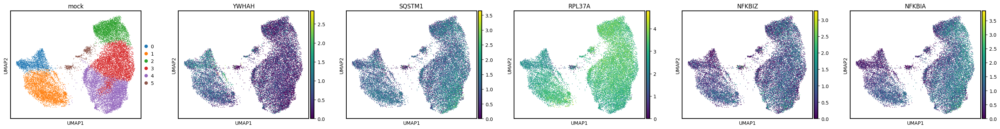

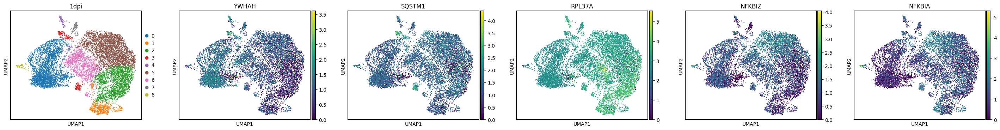

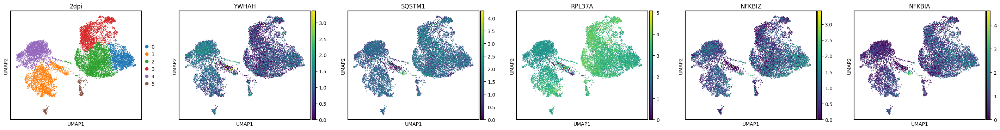

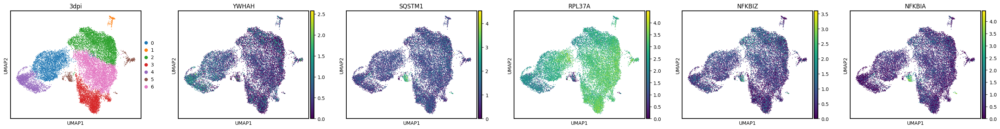

In [48]:
sc.pl.umap(
    mock_adata,
    color=[ "leiden_res0_02", 'YWHAH', 'SQSTM1', 'RPL37A', 'NFKBIZ', 'NFKBIA'],
    ncols=8,
    title= 'mock'
)

sc.pl.umap(
    srv_1dpi_adata,
    color=[ "leiden_res0_02", 'YWHAH', 'SQSTM1', 'RPL37A', 'NFKBIZ', 'NFKBIA'],
    ncols=8,
    title= '1dpi'
)

sc.pl.umap(
    srv_2dpi_adata,
    color=[ "leiden_res0_02", 'YWHAH', 'SQSTM1', 'RPL37A', 'NFKBIZ','NFKBIA' ],
    ncols=8,
    title= '2dpi'
)

sc.pl.umap(
    srv_3dpi_adata,
    color=[ "leiden_res0_02", 'YWHAH', 'SQSTM1', 'RPL37A', 'NFKBIZ', 'NFKBIA'],
    ncols=8,
    title= '3dpi'
)

In [49]:
#mock
dict_ann_mock_raw = mock_adata_gene_rank[mock_adata_gene_rank["stat"] > 0].groupby("group").head().set_index("group")["name"].to_dict()
dict_ann_mock = {k: f"{v} ({k})" for k, v in dict_ann_mock_raw.items()}
display(dict_ann_mock)

#1dpi
dict_ann_1dpi_raw = srv_1dpi_adata_gene_rank[srv_1dpi_adata_gene_rank["stat"] > 0].groupby("group").head().set_index("group")["name"].to_dict()
dict_ann_1dpi = {k: f"{v} ({k})" for k, v in dict_ann_1dpi_raw.items()}
display(dict_ann_1dpi)

#2dpi
dict_ann_2dpi_raw = srv_2dpi_adata_gene_rank[srv_2dpi_adata_gene_rank["stat"] > 0].groupby("group").head().set_index("group")["name"].to_dict()
dict_ann_2dpi = {k: f"{v} ({k})" for k, v in dict_ann_2dpi_raw.items()}
display(dict_ann_2dpi)

#3dpi
dict_ann_3dpi_raw = srv_3dpi_adata_gene_rank[srv_3dpi_adata_gene_rank["stat"] > 0].groupby("group").head().set_index("group")["name"].to_dict()
dict_ann_3dpi = {k: f"{v} ({k})" for k, v in dict_ann_3dpi_raw.items()}
display(dict_ann_3dpi)

{'0': 'Airway epithelial cells (0)',
 '2': 'Mesothelial cells (2)',
 '3': 'Smooth muscle cells (3)',
 '4': 'Ciliated cells (4)',
 '1': 'Pulmonary alveolar type II cells (1)',
 '5': 'Ionocytes (5)'}

{'0': 'Myofibroblasts (0)',
 '1': 'Smooth muscle cells (1)',
 '2': 'Airway smooth muscle cells (2)',
 '3': 'Airway epithelial cells (3)',
 '4': 'Ionocytes (4)',
 '5': 'Pulmonary alveolar type I cells (5)',
 '6': 'Pulmonary alveolar type II cells (6)',
 '7': 'Airway epithelial cells (7)',
 '8': 'Pulmonary alveolar type II cells (8)'}

{'0': 'Mesothelial cells (0)',
 '1': 'Airway epithelial cells (1)',
 '3': 'Myofibroblasts (3)',
 '4': 'Airway epithelial cells (4)',
 '2': 'Vascular smooth muscle cells (2)',
 '5': 'Ionocytes (5)'}

{'0': 'Airway goblet cells (0)',
 '1': 'Alveolar macrophages (1)',
 '2': 'Epithelial cells (2)',
 '3': 'Smooth muscle cells (3)',
 '4': 'Vascular smooth muscle cells (4)',
 '5': 'Smooth muscle cells (5)',
 '6': 'Epithelial cells (6)'}

In [50]:
#mock
mock_adata.obs["leiden_res0_02"] = mock_adata.obs["leiden_res0_02"].cat.rename_categories(dict_ann_mock)

#1dpi
srv_1dpi_adata.obs["leiden_res0_02"] = srv_1dpi_adata.obs["leiden_res0_02"].cat.rename_categories(dict_ann_1dpi)

#2dpi
srv_2dpi_adata.obs["leiden_res0_02"] = srv_2dpi_adata.obs["leiden_res0_02"].cat.rename_categories(dict_ann_2dpi)

#3dpi
srv_3dpi_adata.obs["leiden_res0_02"] = srv_3dpi_adata.obs["leiden_res0_02"].cat.rename_categories(dict_ann_3dpi)

In [51]:
print("Performing differential expression analysis for mock_adata...")
sc.tl.rank_genes_groups(mock_adata, groupby='leiden_res0_02', method='wilcoxon', rankby_abs=True, key_added='rank_genes_groups_mock')
print("Done with mock_adata.\nPerforming differential expression analysis for srv_1dpi_adata...")
sc.tl.rank_genes_groups(srv_1dpi_adata, groupby='leiden_res0_02', method='wilcoxon', rankby_abs=True, key_added='rank_genes_groups_1dpi')
print("Done with srv_1dpi_adata.\nPerforming differential expression analysis for srv_2dpi_adata...")
sc.tl.rank_genes_groups(srv_2dpi_adata, groupby='leiden_res0_02', method='wilcoxon', rankby_abs=True, key_added='rank_genes_groups_2dpi')
print("Done with srv_2dpi_adata.\nPerforming differential expression analysis for srv_3dpi_adata...")
sc.tl.rank_genes_groups(srv_3dpi_adata, groupby='leiden_res0_02', method='wilcoxon', rankby_abs=True, key_added='rank_genes_groups_3dpi')
print("Done with srv_3dpi_adata.")

Performing differential expression analysis for mock_adata...
Done with mock_adata.
Performing differential expression analysis for srv_1dpi_adata...
Done with srv_1dpi_adata.
Performing differential expression analysis for srv_2dpi_adata...
Done with srv_2dpi_adata.
Performing differential expression analysis for srv_3dpi_adata...
Done with srv_3dpi_adata.


In [52]:
adata_combined = ad.concat([mock_adata, srv_1dpi_adata, srv_2dpi_adata, srv_3dpi_adata])

# Create a combined 'condition_cell_type' column for dot plot grouping
adata_combined.obs['condition_cell_type'] = adata_combined.obs['condition'].astype(str) + '_' + adata_combined.obs['leiden_res0_02'].astype(str)

print("Combined AnnData object created and 'condition_cell_type' column added.")
print(adata_combined.obs['condition_cell_type'].value_counts().head())

Combined AnnData object created and 'condition_cell_type' column added.
condition_cell_type
mock_Smooth muscle cells (3)                 5942
mock_Ciliated cells (4)                      5868
3dpi_Epithelial cells (6)                    5257
3dpi_Epithelial cells (2)                    5201
mock_Pulmonary alveolar type II cells (1)    4219
Name: count, dtype: int64


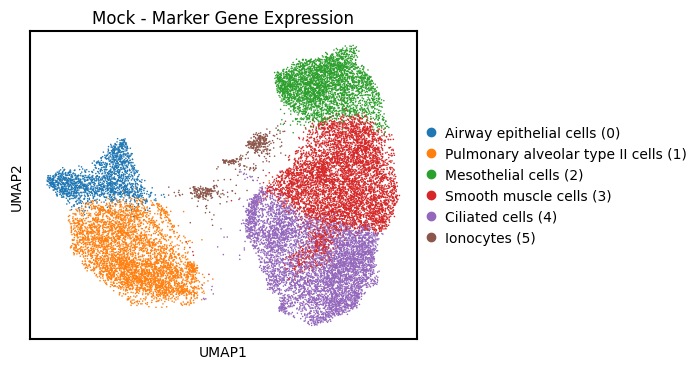

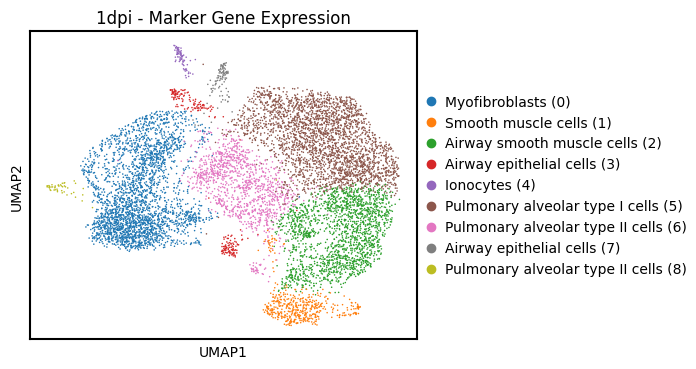

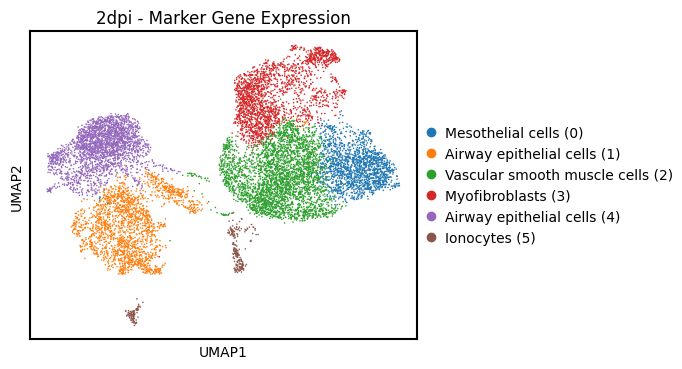

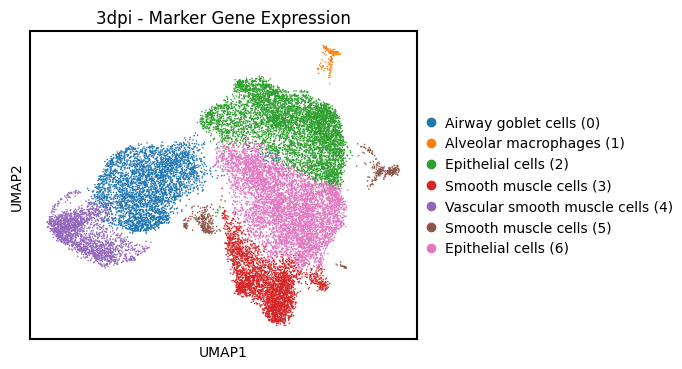

In [53]:
#Visualisation of cell annotation
# Leiden clustering identifies transcriptionally similar cell groups.
# This helps distinguish infected vs. bystander cell populations across infection stages.
#mock
sc.pl.umap(
    mock_adata,
    color=["leiden_res0_02"],
    ncols=3,
    title='Mock - Marker Gene Expression',
    size=5
)

#1dpi
sc.pl.umap(
    srv_1dpi_adata,
    color=["leiden_res0_02"],
    ncols=3,
    title='1dpi - Marker Gene Expression',
    size=5
)

#2dpi
sc.pl.umap(
    srv_2dpi_adata,
    color=["leiden_res0_02"],
    ncols=3,
    title='2dpi - Marker Gene Expression',
    size=5
)

#3dpi
sc.pl.umap(
    srv_3dpi_adata,
    color=["leiden_res0_02"],
    ncols=3,
    title='3dpi - Marker Gene Expression',
    size=5
)

#### 03. Check cell-type composition per infection stage.

In [54]:
adata.obs['condition'].value_counts()

,count
condition,
3dpi,28530
mock,22609
2dpi,14695
1dpi,11834


##### Data Analysis Key Findings
A total of 485 unique marker genes were extracted from the markers DataFrame, serving as a basis for cell type annotation. Differential expression analysis was successfully performed for mock_adata, srv_1dpi_adata, srv_2dpi_adata, and srv_3dpi_adata using the Wilcoxon method, identifying cluster-specific significant genes for each condition. UMAP visualizations were generated for all four conditions (mock, 1dpi, 2dpi, 3dpi), effectively displaying the distribution and expression levels of selected marker genes like KRT5, CD14, ACTA2, SFTPC, and SCGB1A1. The dot plot, combining data from all conditions and cell types, was successfully created to compare marker expression patterns and statistical significance across all groups, providing an integrated view of  expression changes.

##Trajectory Inference
####It is an attempt to understand how cells transition from one type to another (like stem → mature)?

In [55]:
#Trajectory analysis
sc.tl.draw_graph(mock_adata)
sc.tl.draw_graph(srv_1dpi_adata)
sc.tl.draw_graph(srv_2dpi_adata)
sc.tl.draw_graph(srv_3dpi_adata)

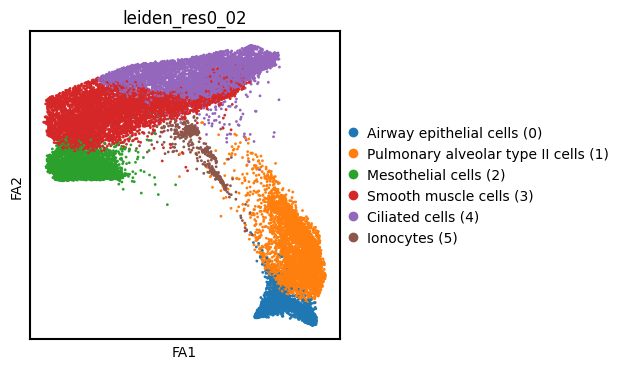

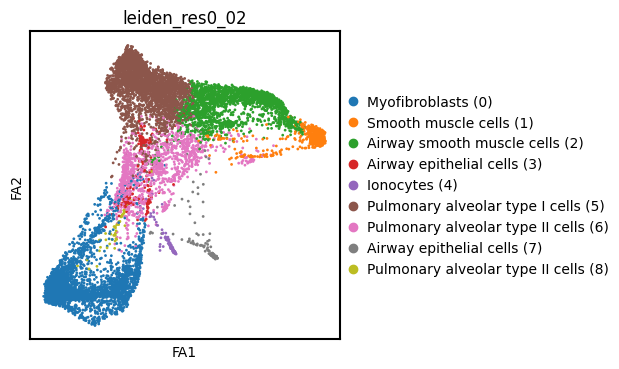

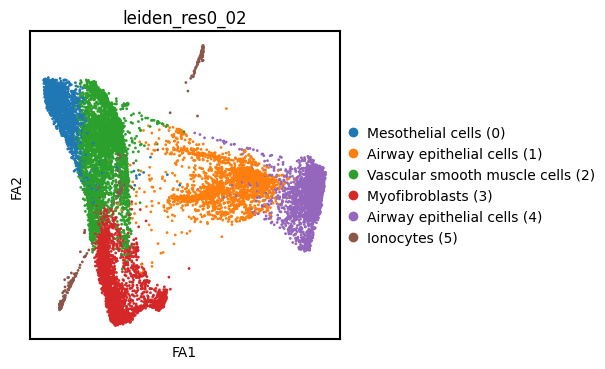

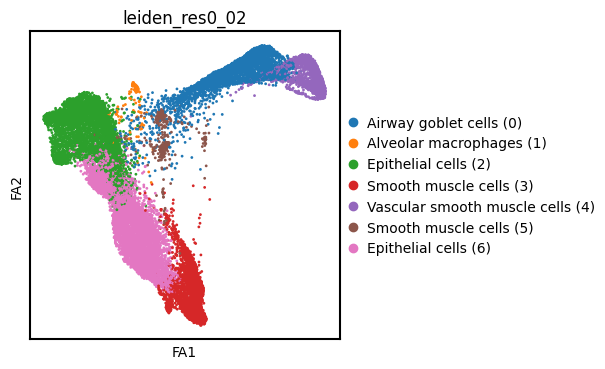

In [56]:
# mock
plt.rcParams["figure.figsize"] = (4,4)
sc.pl.draw_graph(mock_adata, color='leiden_res0_02', size = 16)

#1dpi
plt.rcParams["figure.figsize"] = (4,4)
sc.pl.draw_graph(srv_1dpi_adata, color='leiden_res0_02', size = 16)

#2dpi
plt.rcParams["figure.figsize"] = (4,4)
sc.pl.draw_graph(srv_2dpi_adata, color='leiden_res0_02', size = 16)

#3dpi
plt.rcParams["figure.figsize"] = (4,4)
sc.pl.draw_graph(srv_3dpi_adata, color='leiden_res0_02', size = 16)

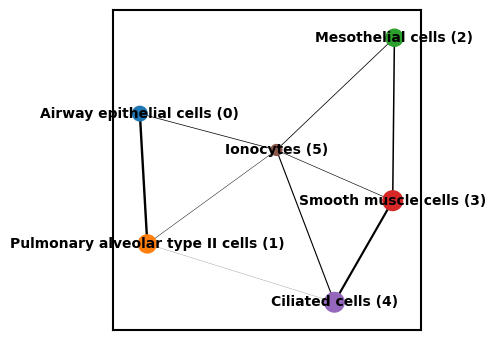

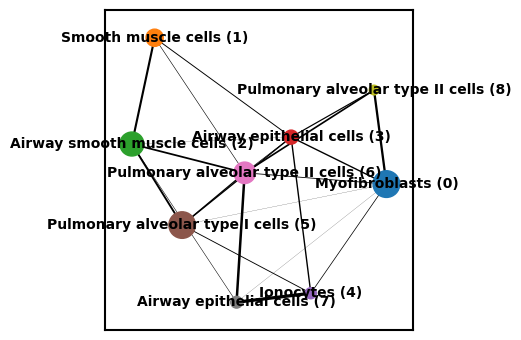

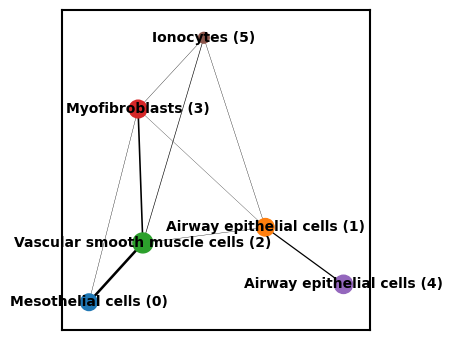

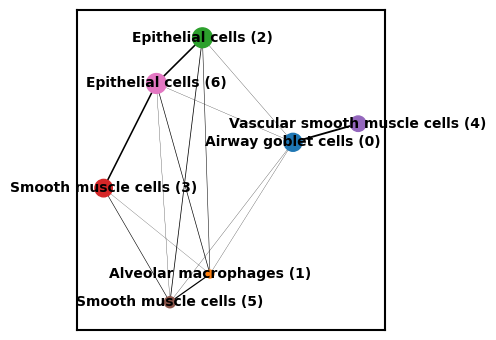

In [57]:
#PAGA mock to 3dpi

sc.tl.paga(mock_adata, groups='leiden_res0_02')
sc.tl.paga(srv_1dpi_adata, groups='leiden_res0_02')
sc.tl.paga(srv_2dpi_adata, groups='leiden_res0_02')
sc.tl.paga(srv_3dpi_adata, groups='leiden_res0_02')

sc.pl.paga(mock_adata, color=['leiden_res0_02'])
sc.pl.paga(srv_1dpi_adata, color=['leiden_res0_02'])
sc.pl.paga(srv_2dpi_adata, color=['leiden_res0_02'])
sc.pl.paga(srv_3dpi_adata, color=['leiden_res0_02'])

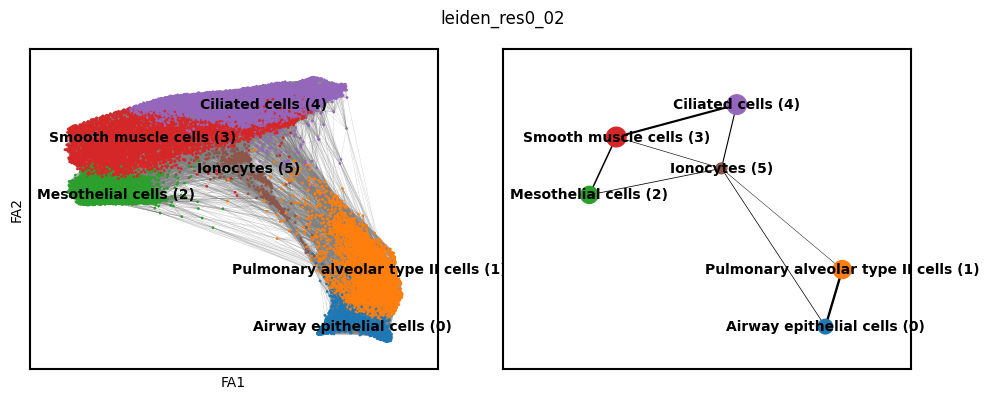

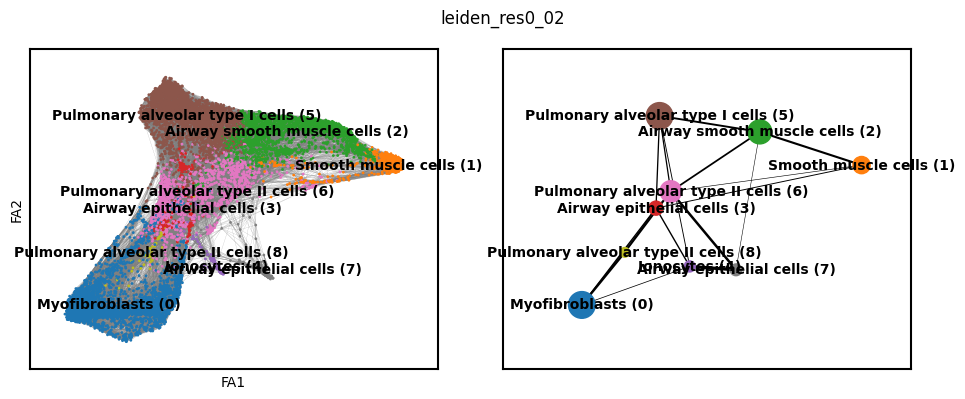

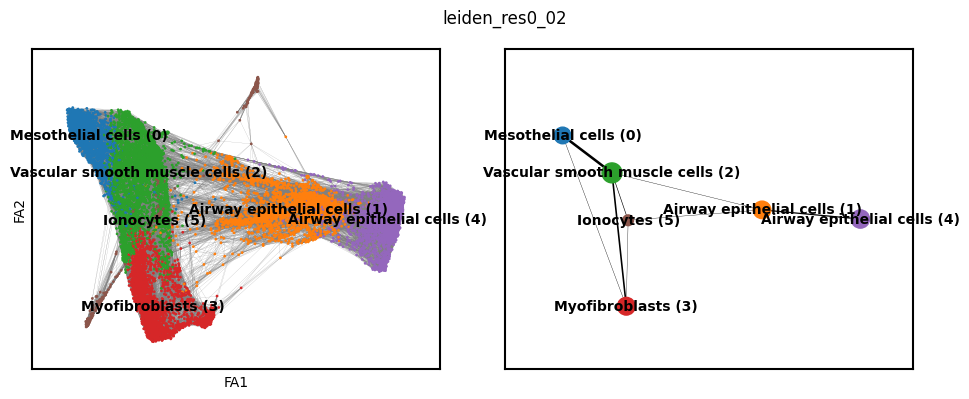

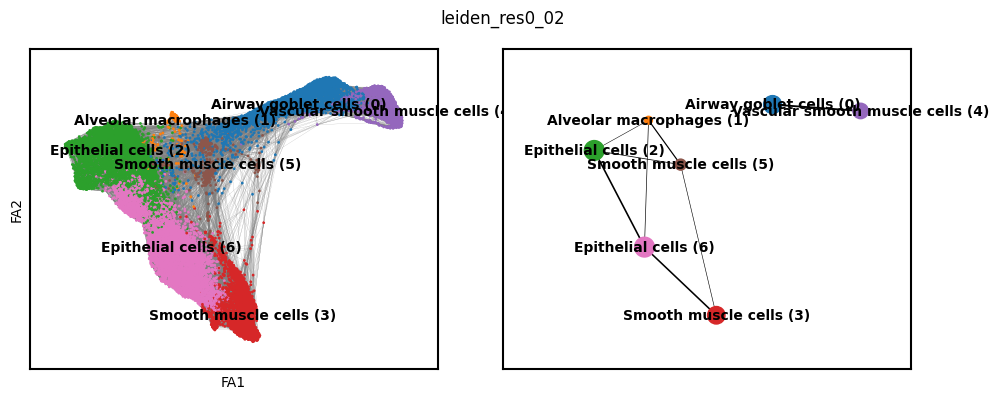

[<Axes: xlabel='FA1', ylabel='FA2'>, <Axes: >]

In [58]:
#mock
plt.rcParams["figure.figsize"] = (5,4)
sc.pl.paga_compare(mock_adata, threshold=0.03, frameon=True, edges=True, size = 16)

#1dpi
plt.rcParams["figure.figsize"] = (5,4)
sc.pl.paga_compare(srv_1dpi_adata, threshold=0.03, frameon=True, edges=True, size = 16)

#2dpi
plt.rcParams["figure.figsize"] = (5,4)
sc.pl.paga_compare(srv_2dpi_adata, threshold=0.03, frameon=True, edges=True, size = 16)

#3dpi
plt.rcParams["figure.figsize"] = (5,4)
sc.pl.paga_compare(srv_3dpi_adata, threshold=0.03, frameon=True, edges=True, size = 16)

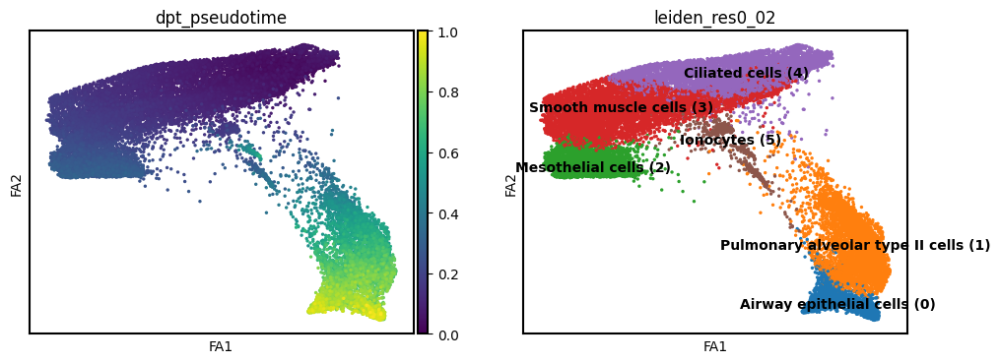

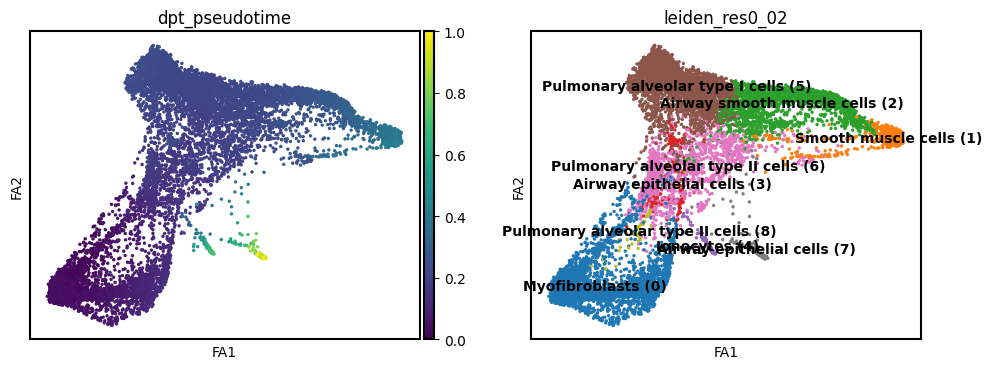

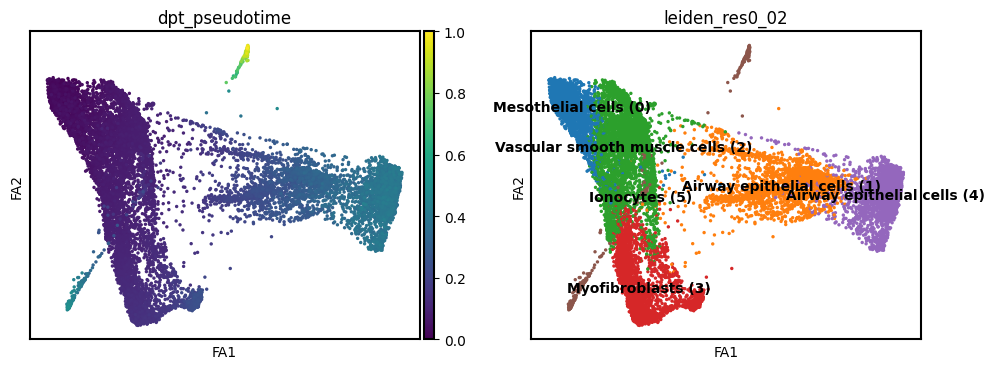

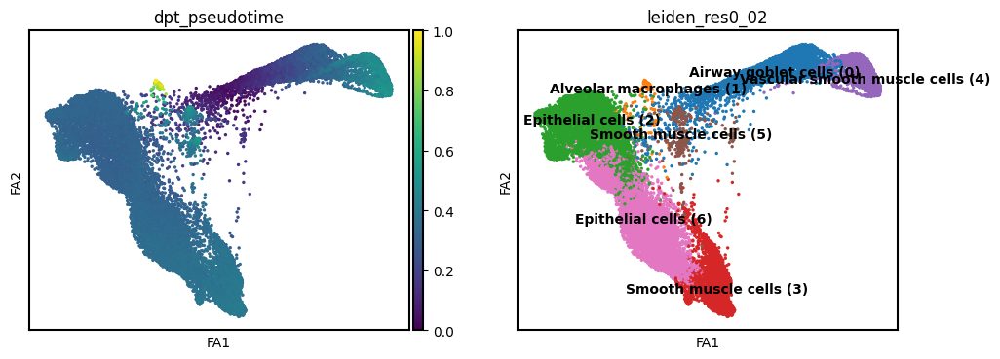

In [59]:
# Calculate diffusion pseudotime (DPT)

# mock
# As an example, let's select a cell from the first cluster (cluster '0') as the root.
# You might need to adjust this based on your biological knowledge.
root_cluster_mock = 'Ciliated cells (4)' # Corrected: based on dict_ann_mock, Ciliated cells is cluster 4
if root_cluster_mock in mock_adata.obs['leiden_res0_02'].cat.categories:
    root_cell_idx_mock = mock_adata.obs['leiden_res0_02'] == root_cluster_mock
    if np.any(root_cell_idx_mock):
        mock_adata.uns['iroot'] = np.flatnonzero(root_cell_idx_mock)[0] # Set iroot
        sc.tl.dpt(mock_adata) # Call dpt without the 'root' argument
    else:
        print(f"Warning: No cells found in cluster {root_cluster_mock} for mock_adata. Skipping DPT calculation.")
else:
    print(f"Warning: Cluster {root_cluster_mock} not found in mock_adata. Skipping DPT calculation.")

# 1dpi
root_cluster_1dpi = 'Myofibroblasts (0)' # Replace with the actual name of your root cluster if '0' is not correct
if root_cluster_1dpi in srv_1dpi_adata.obs['leiden_res0_02'].cat.categories:
    root_cell_idx_1dpi = srv_1dpi_adata.obs['leiden_res0_02'] == root_cluster_1dpi
    if np.any(root_cell_idx_1dpi):
        srv_1dpi_adata.uns['iroot'] = np.flatnonzero(root_cell_idx_1dpi)[0] # Set iroot
        sc.tl.dpt(srv_1dpi_adata) # Call dpt without the 'root' argument
    else:
        print(f"Warning: No cells found in cluster {root_cluster_1dpi} for srv_1dpi_adata. Skipping DPT calculation.")
else:
    print(f"Warning: Cluster {root_cluster_1dpi} not found in srv_1dpi_adata. Skipping DPT calculation.")

# 2dpi
root_cluster_2dpi = 'Mesothelial cells (0)' # Replace with the actual name of your root cluster if '0' is not correct
if root_cluster_2dpi in srv_2dpi_adata.obs['leiden_res0_02'].cat.categories:
    root_cell_idx_2dpi = srv_2dpi_adata.obs['leiden_res0_02'] == root_cluster_2dpi
    if np.any(root_cell_idx_2dpi):
        srv_2dpi_adata.uns['iroot'] = np.flatnonzero(root_cell_idx_2dpi)[0] # Set iroot
        sc.tl.dpt(srv_2dpi_adata) # Call dpt without the 'root' argument
    else:
        print(f"Warning: No cells found in cluster {root_cluster_2dpi} for srv_2dpi_adata. Skipping DPT calculation.")
else:
    print(f"Warning: Cluster {root_cluster_2dpi} not found in srv_2dpi_adata. Skipping DPT calculation.")

# 3dpi
root_cluster_3dpi = 'Airway goblet cells (0)' # Replace with the actual name of your root cluster if '0' is not correct
if root_cluster_3dpi in srv_3dpi_adata.obs['leiden_res0_02'].cat.categories:
    root_cell_idx_3dpi = srv_3dpi_adata.obs['leiden_res0_02'] == root_cluster_3dpi
    if np.any(root_cell_idx_3dpi):
        srv_3dpi_adata.uns['iroot'] = np.flatnonzero(root_cell_idx_3dpi)[0] # Set iroot
        sc.tl.dpt(srv_3dpi_adata) # Call dpt without the 'root' argument
    else:
        print(f"Warning: No cells found in cluster {root_cluster_3dpi} for srv_3dpi_adata. Skipping DPT calculation.")
else:
    print(f"Warning: Cluster {root_cluster_3dpi} not found in srv_3dpi_adata. Skipping DPT calculation.")

# Now plot with dpt_pseudotime
sc.pl.draw_graph(mock_adata, color=['dpt_pseudotime', 'leiden_res0_02'], legend_loc='on data', size = 24)
sc.pl.draw_graph(srv_1dpi_adata, color=['dpt_pseudotime', 'leiden_res0_02'], legend_loc='on data', size = 24)
sc.pl.draw_graph(srv_2dpi_adata, color=['dpt_pseudotime', 'leiden_res0_02'], legend_loc='on data', size = 24)
sc.pl.draw_graph(srv_3dpi_adata, color=['dpt_pseudotime', 'leiden_res0_02'], legend_loc='on data', size = 24)

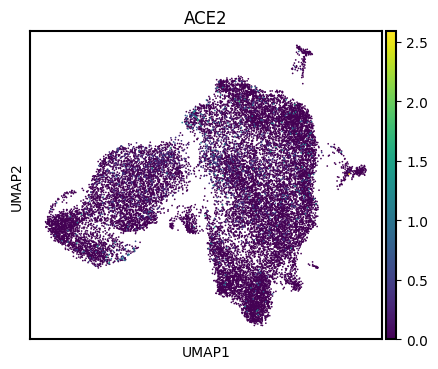

In [60]:
sc.pl.umap(srv_3dpi_adata, color=['ACE2'], cmap='viridis')

🔹 Kruskal–Wallis test across clusters
   H = 243.631, p = 9.414e-50

🔹 Pairwise Mann–Whitney tests (FDR-corrected)


,Cluster1,Cluster2,U_stat,p_value,p_adj
2,Airway goblet cells (0),Smooth muscle cells (3),6050655.0,1.861583e-43,3.909325e-42
17,Smooth muscle cells (3),Epithelial cells (6),7953316.0,1.793850e-25,1.883543e-24
11,Epithelial cells (2),Smooth muscle cells (3),8600388.5,3.204194e-19,2.242936e-18
3,Airway goblet cells (0),Vascular smooth muscle cells (4),3632896.0,1.883054e-16,9.886031e-16
1,Airway goblet cells (0),Epithelial cells (2),9513787.5,2.745329e-11,1.153038e-10
4,Airway goblet cells (0),Smooth muscle cells (5),972844.0,1.872207e-10,6.552724e-10
19,Vascular smooth muscle cells (4),Epithelial cells (6),4945503.0,2.104873e-07,6.314620e-07
20,Smooth muscle cells (5),Epithelial cells (6),1265088.0,7.817330e-07,2.052049e-06
5,Airway goblet cells (0),Epithelial cells (6),9530135.5,1.378804e-06,3.217210e-06
13,Epithelial cells (2),Smooth muscle cells (5),1382615.0,1.225402e-05,2.573345e-05


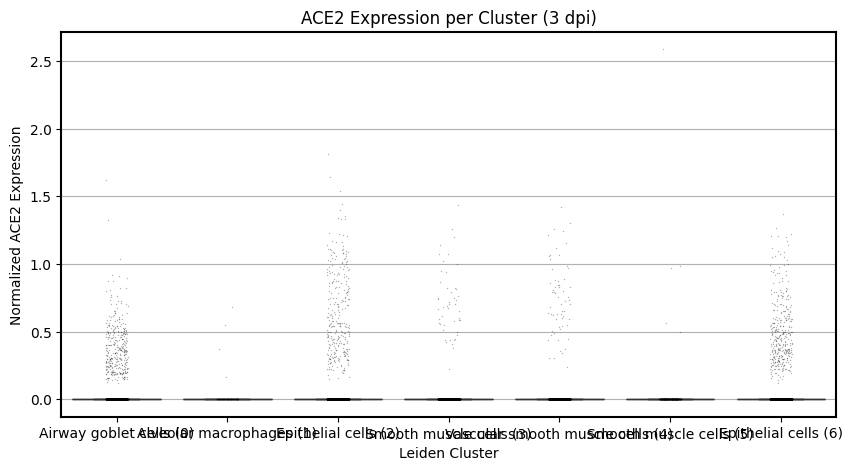


🔹 Chi-squared test for ACE2+ enrichment
   χ² = 255.84, p = 2.313e-52

✅ Cluster Airway goblet cells (0) shows the highest mean ACE2 expression at 3 dpi.


In [66]:
# --- Statistical verification of ACE2 cluster enrichment (3 dpi) ---
import pandas as pd
import numpy as np
from scipy.stats import kruskal, mannwhitneyu, chi2_contingency
from statsmodels.stats.multitest import multipletests
import itertools
import seaborn as sns
import matplotlib.pyplot as plt

# --- Step 1: Extract ACE2 expression and cluster assignments ---
ace2_values = srv_3dpi_adata[:, "ACE2"].X.toarray().flatten()
clusters = srv_3dpi_adata.obs["leiden_res0_02"].values
df = pd.DataFrame({"cluster": clusters, "ACE2": ace2_values})

# --- Step 2: Global test (Kruskal–Wallis) ---
groups = [df.loc[df['cluster'] == c, 'ACE2'].values for c in df['cluster'].unique()]
stat, p_value = kruskal(*groups)
print("🔹 Kruskal–Wallis test across clusters")
print(f"   H = {stat:.3f}, p = {p_value:.3e}")

# --- Step 3: Pairwise Mann–Whitney U tests with FDR correction ---
pairs = list(itertools.combinations(df['cluster'].unique(), 2))
results = []
for c1, c2 in pairs:
    x = df.loc[df['cluster'] == c1, 'ACE2']
    y = df.loc[df['cluster'] == c2, 'ACE2']
    stat, p = mannwhitneyu(x, y, alternative='two-sided')
    results.append([c1, c2, stat, p])

results_df = pd.DataFrame(results, columns=['Cluster1', 'Cluster2', 'U_stat', 'p_value'])
results_df['p_adj'] = multipletests(results_df['p_value'], method='fdr_bh')[1]

# Print the most significant differences
print("\n🔹 Pairwise Mann–Whitney tests (FDR-corrected)")
display(results_df.sort_values('p_adj').head(10))

# --- Step 4: Visualization ---
plt.figure(figsize=(10, 5))
sns.boxplot(x='cluster', y='ACE2', data=df, showfliers=False, palette='viridis')
sns.stripplot(x='cluster', y='ACE2', data=df, color='black', alpha=0.3, size=1)
plt.title("ACE2 Expression per Cluster (3 dpi)")
plt.ylabel("Normalized ACE2 Expression")
plt.xlabel("Leiden Cluster")
plt.show()

# --- Step 5: Optional Chi-square test for ACE2+ cell enrichment ---
df['ACE2_positive'] = df['ACE2'] > 0
contingency = pd.crosstab(df['cluster'], df['ACE2_positive'])
chi2, p_chi, dof, expected = chi2_contingency(contingency)
print("\n🔹 Chi-squared test for ACE2+ enrichment")
print(f"   χ² = {chi2:.2f}, p = {p_chi:.3e}")

# --- Step 6: Interpret automatically ---
top_cluster = (
    df.groupby("cluster")["ACE2"].mean()
    .sort_values(ascending=False)
    .index[0]
)
print(f"\n✅ Cluster {top_cluster} shows the highest mean ACE2 expression at 3 dpi.")